# Semantic Segmentation: SegFormer finetuned on RescueNet

This notebook is a modification of the [Hugging Face tutorial for *Semantic Segmentation*](https://huggingface.co/docs/transformers/v4.33.0/en/tasks/semantic_segmentation#inference). 

The objective of the notebook is to fine tune a pretrained model on a custom dataset to predict the segmentation masks of the images.

<div style="font-size:15px; font-family:verdana; line-height: 1.7em">
<h1 id = "Introduction">
Introduction </h1>

<br> 

Semantic segmentation is a computer vision technique for assigning a label to each pixel in an image, representing the semantic class of the objects or regions in the image.<br> It's a form of dense prediction because it involves assigning a label to each pixel in an image, instead of just boxes around objects or key points as in object detection or instance segmentation.<br> The goal of semantic segmentation is to recognize and understand the objects and scenes in an image, and partition the image into segments corresponding to different entities.

<div style="font-size:15px; font-family:verdana; line-height: 1.7em">
 <h1 id = "SegFormer">SegFormer
    </h1>
SegFormer is a Transformer-based framework for semantic segmentation that unifies Transformers with lightweight multilayer perceptron (MLP) decoders. 
<br>SegFormer has two appealing features:<li> 1) SegFormer comprises a novel hierarchically structured Transformer encoder which outputs multiscale features. <br> It does not need positional encoding, thereby avoiding the interpolation of positional codes which leads to decreased performance when the testing resolution differs from training. </li>  <li>2) SegFormer avoids complex decoders. The proposed MLP decoder aggregates information from different layers, and thus combining both local attention and global attention to render powerful representations.</li>
    
    
    <cite> Image from huggingface.com </cite>

For this project, we will use the pretrained model [SegFormer (b0-sized) model](https://huggingface.co/nvidia/segformer-b0). The main characteristics of the SegFormer model are its efficiency and its very light weight (we will see this in the training section).

# Setup
* Import libraries
* Define the constants

In [2]:
import json
import os

import numpy as np
import matplotlib.pyplot as plt

import torch
from torch import nn

from torch.utils.data import DataLoader

from huggingface_hub import cached_download, hf_hub_url
from transformers import (
    AutoImageProcessor,
    SegformerForSemanticSegmentation,
    Trainer,
)
import torchvision
from datasets import load_dataset, load_metric
#import evaluate
from transformers import SegformerImageProcessor

from torch.utils.data import Dataset
from PIL import Image
import sklearn
from torch import nn
from tqdm.notebook import tqdm
import pandas as pd
import matplotlib.pyplot as plt


In [3]:

MODEL_CHECKPOINT0 = "nvidia/mit-b0"
MODEL_CHECKPOINT1 = "nvidia/mit-b1"
MODEL_CHECKPOINT2 = "nvidia/mit-b2"
MODEL_CHECKPOINT3 = "nvidia/mit-b3"
MODEL_CHECKPOINT4 = "nvidia/mit-b4"
BATCH_SIZE = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ROOT_DIR = "/kaggle/input/rescuenet/RescueNet"

In [4]:

# 12 categories in the dataset
class_names = {
    "0": "Background", "1": "Debris", "2": "Water", "3": "Building_No_Damage",
    "4": "Building_Minor_Damage", "5": "Building_Major_Damage", 
    "6": "Building_Total_Destruction", "7": "Vehicle", "8": "Road",
    "9": "Tree", "10": "Pool", "11": "Sand"
}

colors = [
    [0, 0, 0], [151, 0, 255], [30, 230, 255], [184, 115, 117], 
    [216, 255, 0], [252, 199, 0], [255, 0, 0], [255, 0, 246], 
    [140, 140, 140], [0, 255, 0], [244, 255, 0], [152, 166, 0]
]
# load id2label mapping from a JSON 
filename = "/kaggle/input/id2label-json/id2label.json"
with open(filename, "r") as json_file:
    id2label = json.load(json_file)
id2label = {int(k): v for k, v in id2label.items()}
label2id = {v: k for k, v in id2label.items()}
print(id2label)


{0: 'Background', 1: 'Debris', 2: 'Water', 3: 'Building_No_Damage', 4: 'Building_Minor_Damage', 5: 'Building_Major_Damage', 6: 'Building_Total_Destruction', 7: 'Vehicle', 8: 'Road', 9: 'Tree', 10: 'Pool', 11: 'Sand'}


<div style="font-size:15px; font-family:verdana; line-height: 1.7em">
 <h1 id = "DataLoader">DataLoader: Load the RescueNet Dataset
    </h1>
    <br>
properly defined datalaoder is one of the crucial steps in training process. It can be understand as data preparation process, 
and what is worth to mention is that properly defined dataset can provide us to properly defined models. 
<br>
I decided to use pytorch library as it is my main framework, and its main pros is how intuitive and informative are dataloaders. 
If you are not aware of pytorch dataloaders I am strongly recommend to read this article:
<br>
<a href="https://pytorch.org/tutorials/beginner/basics/data_tutorial.html">Pytorch Data Tutorial</a>

<div style="font-size:15px; font-family:verdana; line-height: 1.7em">
 <h1 id = "DataFlow">DataFlow
    </h1>
    <br>
    
So, to properly and intuitively visualize the data flow,
this are the steps that has to be done to build proper dataloader, which can be seen as below, 
from code point of view. 

1. Assign path in which data is stored
2. Describe how the data has to be loaded (for images, and mask equivalently). 
3. Process data, resizing or tweak it a little to make model more robust to variance in validation/test dataset.
4. create an iterator which 'll return a pair of images, which can be feed straight to our algorithm. 

In [8]:
class SemanticSegmentationDataset(Dataset):
    """Image (semantic) segmentation dataset."""

    def __init__(self, root_dir, image_processor, sub_path ):
        """
        Args:
            root_dir (string): Root directory of the dataset containing the images + annotations.
            image_processor (SegFormerImageProcessor): image processor to prepare images + segmentation maps.
            sub_path (string): load parts of the dataset, train, val, test.
        """
        self.root_dir = root_dir
        self.image_processor = image_processor
        self.sub_path = sub_path
        

        self.img_dir = os.path.join(self.root_dir,  self.sub_path, self.sub_path+"-org-img")
        self.ann_dir = os.path.join(self.root_dir,  self.sub_path, self.sub_path+"-label-img")

        print(self.img_dir)
        print(self.ann_dir)

        # read images
        image_file_names = []
        for root, dirs, files in os.walk(self.img_dir):
              image_file_names.extend(files)
        self.images = sorted(image_file_names)

        # read annotations
        annotation_file_names = []
        for root, dirs, files in os.walk(self.ann_dir):
              annotation_file_names.extend(files)
        self.annotations = sorted(annotation_file_names)

        assert len(self.images) == len(self.annotations), "There must be as many images as there are segmentation maps"


    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        image = Image.open(os.path.join(self.img_dir, self.images[idx]))
        segmentation_map = Image.open(os.path.join(self.ann_dir, self.annotations[idx]))

        # Preprocess the images and segmentation maps
        encoded_inputs = self.image_processor(image, segmentation_map, return_tensors="pt")

        for k, v in encoded_inputs.items():
            encoded_inputs[k].squeeze_()  # remove batch dimension

        return encoded_inputs


In [6]:

image_processor = SegformerImageProcessor(do_reduce_labels=True)
train_dataset = SemanticSegmentationDataset(root_dir=ROOT_DIR, image_processor=image_processor, sub_path="train")
valid_dataset = SemanticSegmentationDataset(root_dir=ROOT_DIR, image_processor=image_processor, sub_path="val")
test_dataset = SemanticSegmentationDataset(root_dir=ROOT_DIR, image_processor=image_processor, sub_path="test")
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
valid_dataloader = DataLoader(valid_dataset, batch_size=BATCH_SIZE)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=4)

/kaggle/input/rescuenet/RescueNet/train/train-org-img
/kaggle/input/rescuenet/RescueNet/train/train-label-img
/kaggle/input/rescuenet/RescueNet/val/val-org-img
/kaggle/input/rescuenet/RescueNet/val/val-label-img
/kaggle/input/rescuenet/RescueNet/test/test-org-img
/kaggle/input/rescuenet/RescueNet/test/test-label-img


# Dataset Analysis 
<div style="font-size:15px;

## Data set Ratio
* Train Set  80%
* Validation Set 10% 
* Test Set 10%
* Total Samples: 4494

In [7]:
print("Number of training samples:", len(train_dataset))
print("Number of validation samples:", len(valid_dataset))
print("Number of test samples:", len(test_dataset))
def datasetDistribution(train, valid, test):
    total = train+valid+test
    print(f"training set is {train *100/total:.1f}%")
    print(f"validation sest is {valid*100/total:.1f}%")
    print(f"testing set is {test*100/total:.1f}%")
    print(f"Total number of data:",total)
datasetDistribution(len(train_dataset),len(valid_dataset),len(test_dataset))

Number of training samples: 3595
Number of validation samples: 449
Number of test samples: 450
training set is 80.0%
validation sest is 10.0%
testing set is 10.0%
Total number of data: 4494


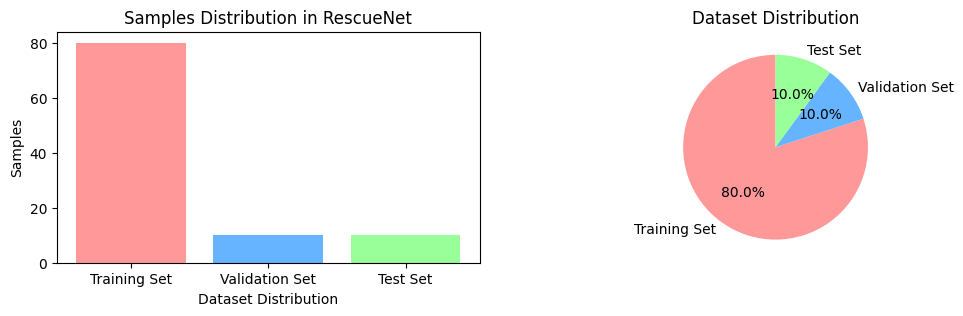

In [39]:
# Data
training_samples = 3595
validation_samples = 449
test_samples = 450

# Calculate percentages
training_percentage = (training_samples / 4494) * 100
validation_percentage = (validation_samples / 4494) * 100
test_percentage = (test_samples / 4494) * 100

# Labels
labels = ['Training Set', 'Validation Set', 'Test Set']
# Data
sizes = [training_percentage, validation_percentage, test_percentage]
# Colors
colors = ['#ff9999','#66b3ff','#99ff99']
# Plot
plt.figure(figsize=(12, 3))
plt.subplot(1, 2, 2)
plt.pie(sizes, colors=colors, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Dataset Distribution')

plt.subplot(1, 2, 1)
plt.bar(labels, sizes, color=colors)
# plt.bar(sizes, labels = labels, colors=colors)
plt.xlabel('Dataset Distribution')
plt.ylabel('Samples')
plt.title('Samples Distribution in RescueNet')
plt.xticks()
plt.show()


## A Quick Look of Input Data

## Inputs
* The pixel_values is the image of 3x512x512  (3 is the channels)
* The labels are the map after process 512x512 (values are in range 0-11)
* The dataloader load 8 pairs of pixel_value and label. 
* (pixel_values: 8x3x512x512 labels: 8x512x512)

In [11]:
encoded_inputs = train_dataset[0]

encoded_inputs["pixel_values"].shape

torch.Size([3, 512, 512])

In [12]:
encoded_inputs["labels"].shape

torch.Size([512, 512])

### Class labels in the map

In [41]:
cls = encoded_inputs["labels"].squeeze().unique()
print("The classes in the map: ", cls)

The classes in the map:  tensor([0, 1, 4, 7, 8, 9])


In [13]:
encoded_inputs["labels"]
# torch.set_printoptions(edgeitems=5)

tensor([[0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])

In [42]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
    print(k, v.shape)

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


pixel_values torch.Size([8, 3, 512, 512])
labels torch.Size([8, 512, 512])


## Class Frenquency Distribution 
<div style="font-size:15px; font-family:verdana;color: red;">
<h3>
*Notice: Do Not Run This Cell    </h3>


In [ ]:
import os.path

'''
Get labeled classes in each subset
'''
def maps_labels(subset):
    df = pd.DataFrame(columns=['file_name','map_classes'])
    set_dir = (f"/kaggle/input/rescuenet/RescueNet/{subset}/{subset}-label-img")
    files = os.listdir(set_dir)
    for filename in files:
        map = Image.open(os.path.join(set_dir, filename))
        map = np.array(map)
        map_classes = np.unique(map)
       
        info = {
        'file_name': [filename[0:5]],
        'map_classes':[map_classes]
        }
        sta = pd.DataFrame(data=info)
        df = pd.concat([df, sta], ignore_index=True)
    return df

test_df = maps_labels("test")
print("test_df finish")
train_df = maps_labels("train")
print("train_df finish")
val_df = maps_labels("val")
print("val_df finish")
'''
Save the dataframe to .csv files
'''
train_df.to_csv('/kaggle/working/stat/train_data_stat.csv', index=False)
test_df.to_csv('/kaggle/working/stat/test_data_stat.csv', index=False)
val_df.to_csv('/kaggle/working/stat/val_data_stat.csv', index=False)

'''
 Sum of each class frequency in 3 subsets. 
'''

def count_classes(res):
    counts = []
    for i in range(12):
        counts.append(res['map_classes'].apply(lambda x: np.count_nonzero(x == i)).sum())
    return counts
test_count = count_classes(test_df)
train_count = count_classes(train_df)
val_count = count_classes(val_df)
total_set_count = []
for i in range(12):
    total_set_count.append(test_count[i]+train_count[i]+val_count[i])
print(f"Total dataset count for each class: {total_set_count}")
print(f"Train dataset count for each class: {train_count}")
print(f"Test dataset count for each class: {test_count}")
print(f"Val dataset count for each class: {val_count}")

'''
Results:
Total dataset count for each class: [769, 3318, 1592, 1902, 1711, 1188, 905, 1701, 2965, 2129, 327, 1409]
Train dataset count for each class: [607, 2636, 1254, 1523, 1365, 956, 729, 1354, 2365, 1682, 263, 1143]
Test dataset count for each class: [79, 349, 175, 194, 182, 115, 84, 179, 306, 234, 36, 122]
Val dataset count for each class: [83, 333, 163, 185, 164, 117, 92, 168, 294, 213, 28, 144]
'''


## Display Frequency Results in Charts

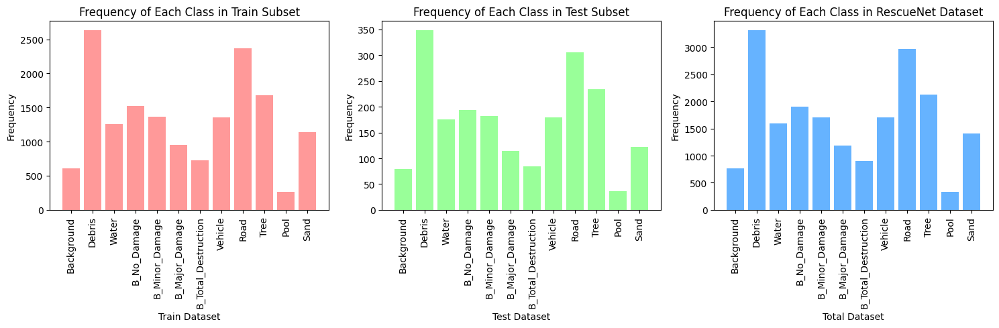

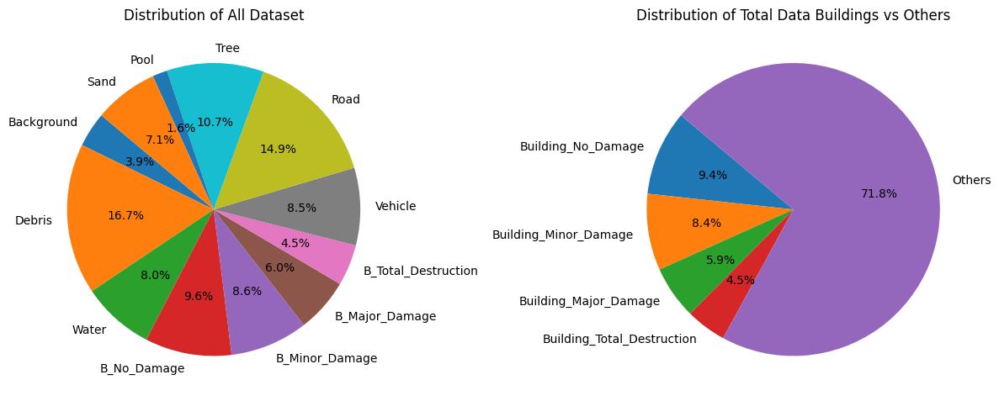

In [50]:

#  Dataset
testdata = [79, 349, 175, 194, 182, 115, 84, 179, 306, 234, 36, 122]
totalData = [769, 3318, 1592, 1902, 1711, 1188, 905, 1701, 2965, 2129, 327, 1409]
trainData = [607, 2636, 1254, 1523, 1365, 956, 729, 1354, 2365, 1682, 263, 1143]

# Labels
labels = {
    0: 'Background',
    1: 'Debris',
    2: 'Water',
    3: 'B_No_Damage',
    4: 'B_Minor_Damage',
    5: 'B_Major_Damage',
    6: 'B_Total_Destruction',
    7: 'Vehicle',
    8: 'Road',
    9: 'Tree',
    10: 'Pool',
    11: 'Sand'
}


# Plotting
plt.figure(figsize=(15, 5))
# Train Dataset
plt.subplot(1, 3, 1)
plt.bar(labels.values(), trainData, color='#ff9999')
plt.xlabel('Train Dataset')
plt.ylabel('Frequency')
plt.title('Frequency of Each Class in Train Subset')
plt.xticks(rotation=90)

# Test Dataset
plt.subplot(1, 3, 2)
plt.bar(labels.values(), testdata, color='#99ff99')
plt.xlabel('Test Dataset')
plt.ylabel('Frequency')
plt.title('Frequency of Each Class in Test Subset')
plt.xticks(rotation=90)

# Total Dataset
plt.subplot(1, 3, 3)
plt.bar(labels.values(), totalData, color='#66b3ff')
plt.xlabel('Total Dataset')
plt.ylabel('Frequency')
plt.title('Frequency of Each Class in RescueNet Dataset')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Plotting pie charts
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.pie(totalData, labels=labels.values(), autopct='%1.1f%%', startangle=140)
plt.title('Distribution of All Dataset')

buildings = [1902, 1711, 1188, 905]  # Only including the specified categories
buildings.append(sum(totalData) - totalData[3]-trainData[4]- totalData[5]- totalData[6])  # Adding the sum to represent "Others"

# Labels
labels2 = {
    0: 'Building_No_Damage',
    1: 'Building_Minor_Damage',
    2: 'Building_Major_Damage',
    3: 'Building_Total_Destruction',
    4: 'Others'
}

plt.subplot(1, 2, 2)
plt.pie(buildings, labels=labels2.values(), autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Total Data Buildings vs Others')
plt.tight_layout()
plt.show()


# Define the SegFormer Model
Here we load the model, and equip the encoder with weights pre-trained on ImageNet-1k (we take the smallest variant, nvidia/mit-b0 here, but you can take a bigger one like nvidia/mit-b5 from the hub). We also set the id2label and label2id mappings, which will be useful when performing inference.

In [9]:
def makeModel(checkpoint):
    
    model = SegformerForSemanticSegmentation.from_pretrained(
                                                            checkpoint,
                                                            num_labels=12,
                                                            ignore_mismatched_sizes=True,
                                                            id2label=id2label,
                                                            label2id=label2id,
                                                            reshape_last_stage=True)
    return model

##  1.Define The initial model

In [10]:
# define the initial model mit-b0
model = makeModel(MODEL_CHECKPOINT0)
# model1 = makeModel(MODEL_CHECKPOINT1)
# model2 = makeModel(MODEL_CHECKPOINT2)
# model3 = makeModel(MODEL_CHECKPOINT3)
# model4 = makeModel(MODEL_CHECKPOINT4)

config.json:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/14.4M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.weight', 'decode_head.classifier.bias', 'decode_head.classifier.weight', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.wei

## Number of Parameters 
* mit-b0
* mit-b1
* mit-b2
* mit-b3
* mit-b4


In [ ]:
def parametersCount():
    for i in range(5):
        model = makeModel(f"nvidia/mit-b{i}")  
        model_parameters = model.parameters()
        # Calculate the total number of parameters
        total_params = sum(p.numel() for p in model_parameters)
        print(f"Total Parameters in mit-b{i}: {total_params}")
parametersCount()
'''
Total Parameters in mit-b0: 3717228
Total Parameters in mit-b1: 13680332
Total Parameters in mit-b2: 27355852
Total Parameters in mit-b3: 47231692
Total Parameters in mit-b4: 64002252
'''

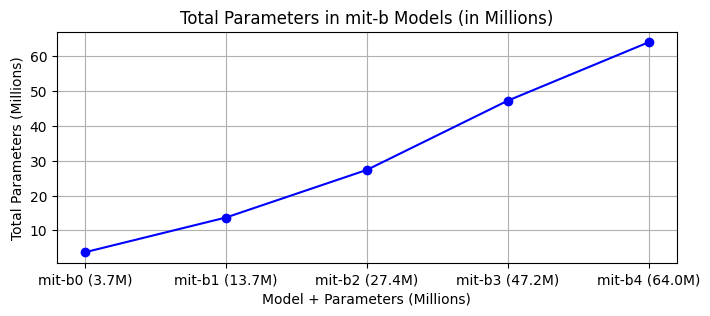

In [51]:
# Data
models = ['mit-b0', 'mit-b1', 'mit-b2', 'mit-b3', 'mit-b4']
parameters = [3717228, 13680332, 27355852, 47231692, 64002252]

# Convert parameters to millions
parameters_million = [param / 1000000 for param in parameters]

# Create custom labels
custom_labels = [f'{model} ({param_m:.1f}M)' for model, param_m in zip(models, parameters_million)]

# Plotting
plt.figure(figsize=(8, 3))
plt.plot(custom_labels, parameters_million, marker='o', color='b', linestyle='-')

# Adding titles and labels
plt.title('Total Parameters in mit-b Models (in Millions)')
plt.xlabel('Model + Parameters (Millions)')
plt.ylabel('Total Parameters (Millions)')
plt.grid(True)

# Display plot
plt.show()


##  2.Define The Metrics
* metric 
* f1

In [52]:
metric = load_metric("mean_iou")

In [47]:
f1 = load_metric("f1")

### Create folders for saving the trained weights and tensorboard log

In [ ]:
from torch.utils.tensorboard import SummaryWriter

# Initialize the TensorBoard writer
writer = SummaryWriter('/kaggle/working/tensorboard')

# The Train Function
Save the best model if the loss is lower than the best known. 

In [ ]:


def train_model_without_validation(model, device,epochs ):
    best_loss = float('inf')  # Initialize with a very large value
    patience = 5  # Number of epochs to wait for improvement
    counter = 0  # Counter for early stopping
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    model.to(device)
    model.train()
    for epoch in range(epochs):  
        print("Epoch:", epoch+5)
        epoch_loss = 0.0
        for idx, batch in enumerate(tqdm(train_dataloader)):
            # get the inputs;
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(pixel_values=pixel_values, labels=labels)
            loss, logits = outputs.loss, outputs.logits

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            with torch.no_grad():
                upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
                predicted = upsampled_logits.argmax(dim=1)

              # note that the metric expects predictions + labels as numpy arrays
                metric.add_batch(predictions=predicted.detach().cpu().numpy(), references=labels.detach().cpu().numpy())


            # evaluate every 200 batches 
            if idx % 100 == 0:
                with torch.no_grad():
    #                 upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
    #                 predicted = upsampled_logits.argmax(dim=1)

                    # Calculate metrics
                    metrics = metric._compute(
                        predictions=predicted.cpu(),
                        references=labels.cpu(),
                        num_labels=len(id2label),
                        ignore_index=255,
                        reduce_labels=False,  # we've already reduced the labels ourselves
                    )

                    # Write metrics to Tensorboard
                    writer.add_scalar('training loss', loss.item())
                    writer.add_scalar('mean_iou', metrics["mean_iou"])
                    writer.add_scalar('mean accuracy', metrics["mean_accuracy"])
                    print("Loss:", loss.item())
                    print("Mean_iou:", metrics["mean_iou"])
                    print("Mean accuracy:", metrics["mean_accuracy"])

        # Calculate average epoch loss
        epoch_loss /= len(train_dataloader)
        writer.add_scalar('epoch loss', epoch_loss)


        # Check if this epoch's loss is the best
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            counter = 0  # Reset counter
            # Save the model
            model.save_pretrained(save_directory = '/kaggle/working/segformer/')
        else:
            counter += 1
            # If no improvement for 'patience' epochs, stop training
            if counter >= patience:
                print(f"No improvement for {patience} epochs. Early stopping...")
                break


    writer.close()

## Train the model with validation 

In [ ]:
import torch
import os
from torch import nn
from transformers import AdamW
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm
from torch.optim.lr_scheduler import CosineAnnealingLR

def train_model_with_validation():

    best_loss = float('inf')  # Initialize with a very large value
    patience = 5  # Number of epochs to wait for improvement
    counter = 0  # Counter for early stopping

    optimizer = AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)
    scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()

    for epoch in range(10):  # loop over the dataset multiple times
        print("Epoch:", epoch)
        epoch_loss = 0.0
        model.train()  # set model to training mode

        for idx, batch in enumerate(tqdm(train_dataloader)):
            # get the inputs
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            loss.backward()
            optimizer.step()
            scheduler.step()

            epoch_loss += loss.item()

            # evaluate every 100 batches 
            if idx % 100 == 0:
                with torch.no_grad():
                    upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
                    predicted = upsampled_logits.argmax(dim=1)

                    # Calculate metrics
                    metrics = metric._compute(
                        predictions=predicted.cpu(),
                        references=labels.cpu(),
                        num_labels=len(id2label),
                        ignore_index=255,
                        reduce_labels=False,  # we've already reduced the labels ourselves
                    )


                    print("Training Loss:", loss.item())
                    print("Training Mean_iou:", metrics["mean_iou"])
                    print("Training Mean accuracy:", metrics["mean_accuracy"])
            model.save_pretrained(save_directory =f'kaggle/working/segformer/segformer-epoch-{epoch}')

        # Validation
        model.eval()  # set model to evaluation mode
        val_loss = 0.0
        for idx, batch in enumerate(tqdm(valid_dataloader)):
            # get the inputs
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            # forward
            outputs = model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            val_loss += loss.item()

            if idx % 100 == 0:
                with torch.no_grad():
                    upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
                    predicted = upsampled_logits.argmax(dim=1)

                    # Calculate metrics
                    metrics = metric._compute(
                        predictions=predicted.cpu(),
                        references=labels.cpu(),
                        num_labels=len(id2label),
                        ignore_index=255,
                        reduce_labels=False,  # we've already reduced the labels ourselves
                    )
                    print("Validation Loss:", loss.item())
                    print("Validation Mean_iou:", metrics["mean_iou"])
                    print("Validation Mean accuracy:", metrics["mean_accuracy"])

        avg_val_loss = val_loss / len(valid_dataloader)
        print(f"Average Validation Loss: {avg_val_loss}")

        # Check if this epoch's loss is the best
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            counter = 0
            # Save the model
            model.save_pretrained(save_directory =f'kaggle/working/segformer/segformer-epoch-{epoch}-{avg_val_loss}')
        else:
            counter += 1
            if counter >= patience:
                print(f"No improvement for {patience} epochs. Early stopping...")
                break


In [ ]:
# Load the TensorBoard extension
# Load the TensorBoard extension
%load_ext tensorboard

# Start TensorBoard
%tensorboard --logdir /kaggle/working/tensorboard

# Load the trained weights and define trained model (continue training or reference)

# Final trained model

* mit-b0 41 epochs
* mit-b1 7 epochs

In [11]:
trained_model = makeModel('/kaggle/input/segtrained41')

# Continue Training

In [ ]:
train_model(trained_model, DEVICE, epochs=50)

In [ ]:
model_parameters = trained_model.parameters()

# Calculate the total number of parameters
total_params = sum(p.numel() for p in model_parameters)
print("Total Parameters:", total_params)

# Inference

 Below you can see a comparison between the predicted mask, and the original mask. 

# Get the predicted image

In [13]:
colors = [
    [0, 0, 0], [151, 0, 255], [30, 230, 255], [184, 115, 117], 
    [216, 255, 0], [252, 199, 0], [255, 0, 0], [255, 0, 246], 
    [140, 140, 140], [0, 255, 0], [244, 255, 0], [152, 166, 0]
]
def apply_color(image):
    color_image = np.zeros((*image.shape, 3), dtype=np.uint8)
    for class_idx, color in enumerate(colors):
        color_image[image == class_idx, :] = color
    return color_image
# show predicted images
def predict_one_image(image, model):
    pixel_values = image_processor(image, return_tensors="pt").pixel_values.to('cpu') #torch.Size([1, 3, 512, 512])
    # forward pass
#     with torch.no_grad():
    outputs = model(pixel_values=pixel_values)
    logits = outputs.logits.cpu() #loss =outputs[0] logits =outputs[1]->torch.Size([1, 12, 128, 128])
    predicted_segmentation_map = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
    predicted_segmentation_map = predicted_segmentation_map.cpu().numpy() #shape (3000x4000) same size as original
    # Initialize an empty array for the colored segmentation map    
    color_image = np.zeros((*predicted_segmentation_map.shape, 3), dtype=np.uint8)
    for class_idx, color in enumerate(colors):
        color_image[predicted_segmentation_map == class_idx - 1, :] = color
    
    prediction_classes = np.unique(predicted_segmentation_map)
    classes =[]
    for k in prediction_classes:
        classes.append(class_names[f"{k+1}"])
#     print("prediction classes: ", classes)
    
#     plt.figure(figsize=(9, 12))
#     plt.imshow(color_seg)
#     plt.title("Segmentation Mask")
#     plt.axis('off')
   
#     plt.show()
    return color_image


# Show Labels
def color_map(mask):
    # Convert map to NumPy array and preprocess it
    mask = np.array(mask)
    # Create coloured map
    color_map = apply_color(mask)
    # Show the segmentation mask with labels
#     plt.figure(figsize=(9, 12))
#     plt.imshow(color_seg)
#     plt.title("Segmentation Mask")
#     plt.axis('off')

#     plt.show()
    mapclass = np.unique(mask)
    classes =[]
    for k in mapclass:
        classes.append(class_names[f"{k}"])
#     print("map classes: ", classes)
#     print("map classes: ",mapclass)
    return color_map
def show_one_comparision(image, mask, checkpoint):
    trained_model = makeModel(f'/kaggle/input/{checkpoint}')
    #display original image, groundtruth label, and prediction for each test sample in the batch. 
    fig, axs = plt.subplots(ncols=3,figsize=(18,24))
    axs[0].imshow(image)
    axs[0].axis('off')
    axs[1].imshow(color_map(mask))
    axs[1].axis('off')
    axs[2].imshow(predict_one_image(image,trained_model))
    axs[2].axis('off')

    # Add legend
    building_colors =[ [184, 115, 117], [216, 255, 0], [252, 199, 0], [255, 0, 0]]
    building_names =  {
        "0": "Building_No_Damage",
        "1": "Building_Minor_Damage",
        "2": "Building_Major_Damage",
        "3": "Building_Total_Destruction"}

    other_colors = [ [0, 0, 0], [151, 0, 255], [30, 230, 255],[255, 0, 246], 
    [140, 140, 140], [0, 255, 0], [244, 255, 0], [152, 166, 0]]
    other_names = {"0": "Background", "1": "Debris", "2": "Water",  "3": "Vehicle", "4": "Road",
    "5": "Tree", "6": "Pool", "7": "Sand"}


    legend_colors = [plt.Rectangle((0,0),1,1, color=np.array(color)/255) for color in building_colors]
#     plt.legend(legend_colors, class_names.values(), loc='upper left', bbox_to_anchor=(1.04,1))
    legend1 = plt.legend(legend_colors, building_names.values(), loc='lower right', bbox_to_anchor=(0, -0.3), ncol=2)
    legend1.Location='SouthWestOutside'
    plt.gca().add_artist(legend1)

    legend_colors2 = [plt.Rectangle((0,0),1,1, color=np.array(color)/255) for color in other_colors]
#     plt.legend(legend_colors, class_names.values(), loc='upper left', bbox_to_anchor=(1.04,1))
    legend2 = plt.legend(legend_colors2, other_names.values(), loc='lower left', bbox_to_anchor=(0, -0.3), ncol=4)
    legend2.Location ='SouthEastOutside'


    plt.show()

# Mask layover Original image 

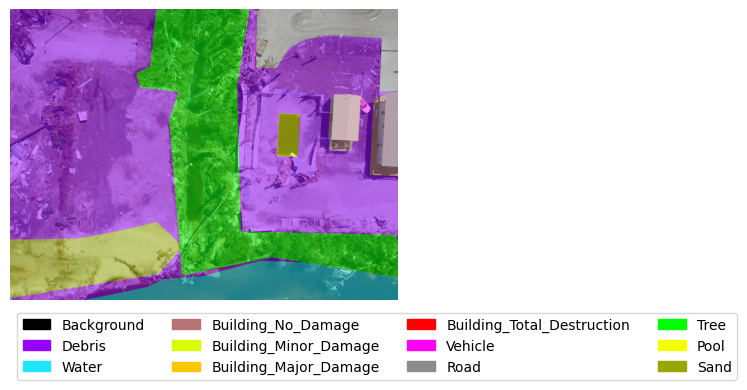

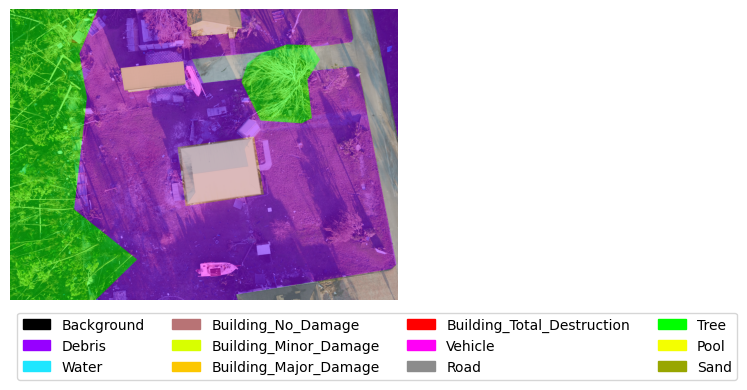

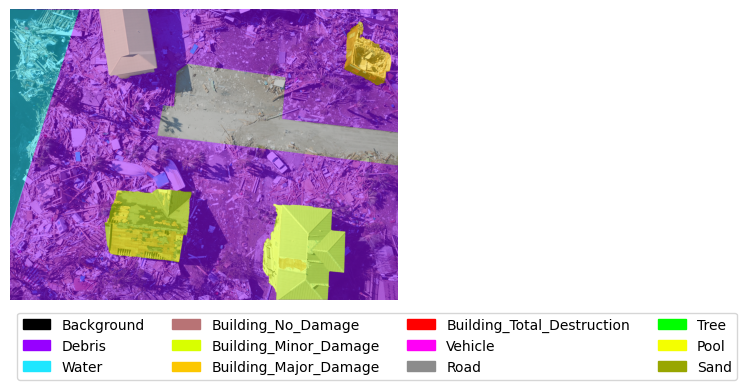

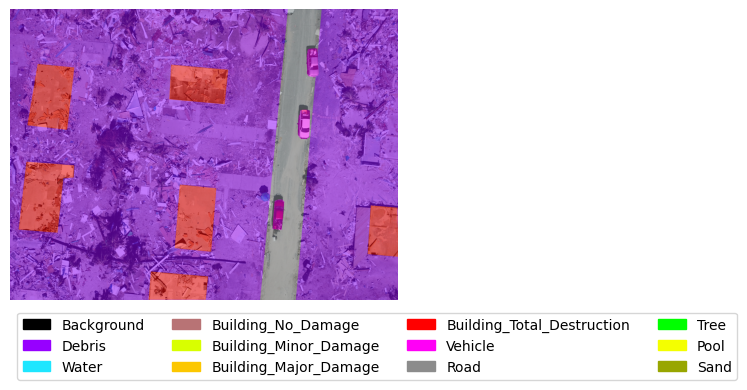

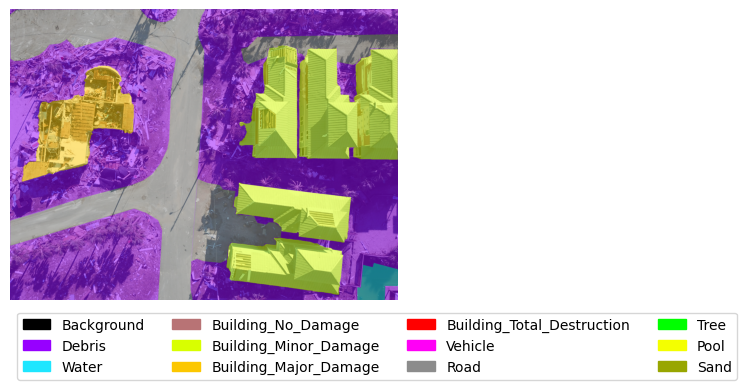

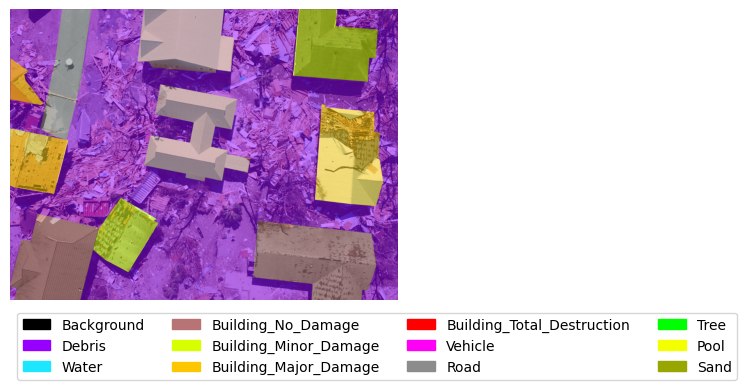

In [14]:
img_dir = "/kaggle/input/rescuenet/RescueNet/test/test-org-img/"
mask_dir = "/kaggle/input/rescuenet/RescueNet/test/test-label-img/"
import os
imglist=[15783, 13205,11236, 10844, 12272,11669]

for filename in imglist:
    image = f'{img_dir}{filename}.jpg'
    mask =f'{mask_dir}{filename}_lab.png'
    if os.path.isfile(image):
        image = Image.open(image)
        mask = Image.open(mask)
        # convert map to NumPy array
        mask = np.array(mask)

        # create coloured map
        color_seg = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8) # height, width, 3
        for label, color in enumerate(colors):
            color_seg[mask == label, :] = color
        # Convert to BGR

        # Show image + mask
        img = np.array(image) * 0.5 + color_seg * 0.5
        img = img.astype(np.uint8)

        plt.figure(figsize=(5,5 ))
        plt.imshow(img)
        plt.axis('off')
        legend_colors = [plt.Rectangle((0,0),1,1, color=np.array(color)/255) for color in colors]
#     plt.legend(legend_colors, class_names.values(), loc='upper left', bbox_to_anchor=(1.04,1))
        legend = plt.legend(legend_colors, class_names.values(), loc='lower left', bbox_to_anchor=(0, -0.3), ncol=4)
        plt.show()

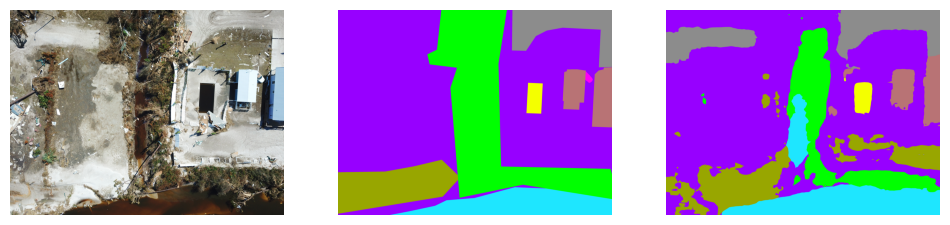

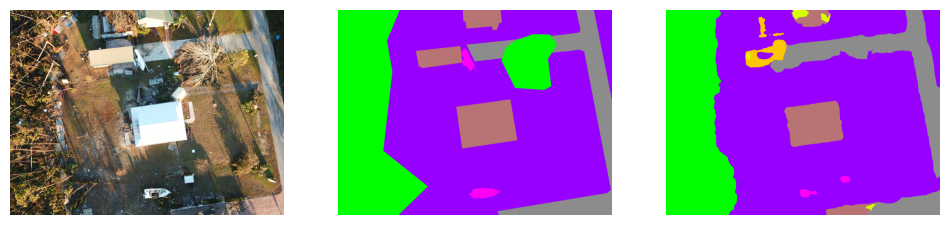

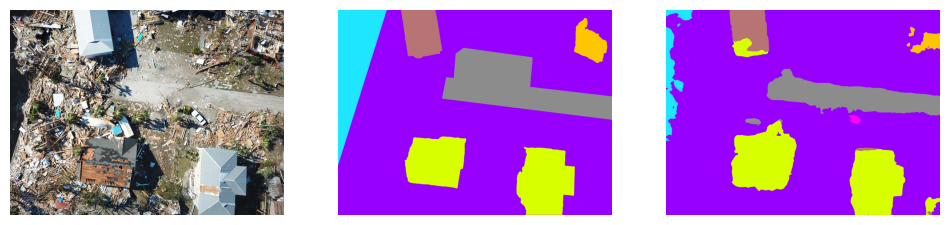

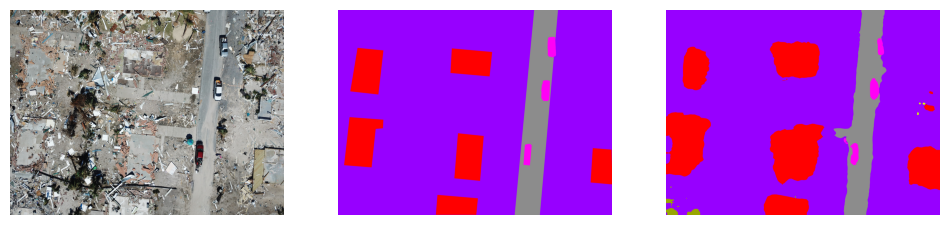

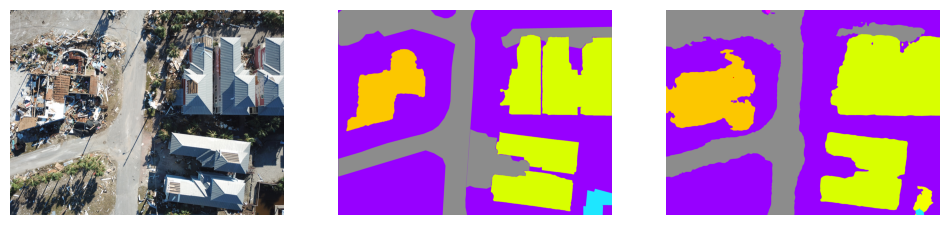

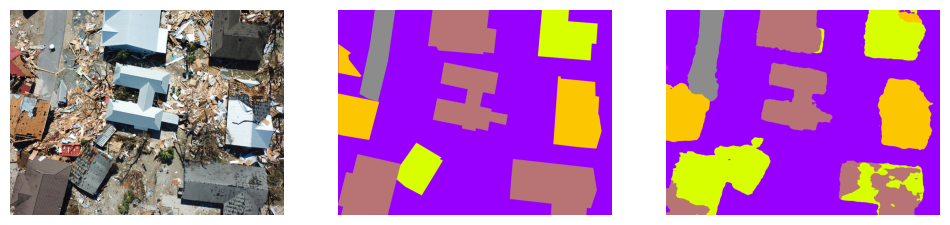

In [17]:
def show_one_comparision_no_checkpoint(image, mask):
    #display original image, groundtruth label, and prediction for each test sample in the batch.
    image = Image.open(image)
    mask = Image.open(mask)
    fig, axs = plt.subplots(ncols=3,figsize=(12,16))
    axs[0].imshow(image)
    axs[0].axis('off')
    axs[1].imshow(color_map(mask))
    axs[1].axis('off')
    axs[2].imshow(predict_one_image(image,trained_model))
    axs[2].axis('off')

    # Add legend
    building_colors =[ [184, 115, 117], [216, 255, 0], [252, 199, 0], [255, 0, 0]]
    building_names =  {
        "0": "Building_No_Damage",
        "1": "Building_Minor_Damage",
        "2": "Building_Major_Damage",
        "3": "Building_Total_Destruction"}

    other_colors = [ [0, 0, 0], [151, 0, 255], [30, 230, 255],[255, 0, 246], 
    [140, 140, 140], [0, 255, 0], [244, 255, 0], [152, 166, 0]]
    other_names = {"0": "Background", "1": "Debris", "2": "Water",  "3": "Vehicle", "4": "Road",
    "5": "Tree", "6": "Pool", "7": "Sand"}
    plt.show()


#     legend_colors = [plt.Rectangle((0,0),1,1, color=np.array(color)/255) for color in building_colors]
# #     plt.legend(legend_colors, class_names.values(), loc='upper left', bbox_to_anchor=(1.04,1))
#     legend1 = plt.legend(legend_colors, building_names.values(), loc='lower right', bbox_to_anchor=(0, -0.3), ncol=2)
#     legend1.Location='SouthWestOutside'
#     plt.gca().add_artist(legend1)

#     legend_colors2 = [plt.Rectangle((0,0),1,1, color=np.array(color)/255) for color in other_colors]
# #     plt.legend(legend_colors, class_names.values(), loc='upper left', bbox_to_anchor=(1.04,1))
#     legend2 = plt.legend(legend_colors2, other_names.values(), loc='lower left', bbox_to_anchor=(0, -0.3), ncol=4)
#     legend2.Location ='SouthEastOutside'


    
imglist=[15783, 13205,11236, 10844, 12272,11669]
origin_dir = '/kaggle/input/rescuenet/RescueNet/test/test-org-img/'
anno_dir = '/kaggle/input/rescuenet/RescueNet/test/test-label-img/'
trained_model = makeModel(f'/kaggle/input/segtrained41')
for i in imglist:
    origin_img = f'{origin_dir}{i}.jpg'
    anno_img = f'{anno_dir}{i}_lab.png'
    show_one_comparision_no_checkpoint(origin_img,anno_img )



## visualize mit-b1

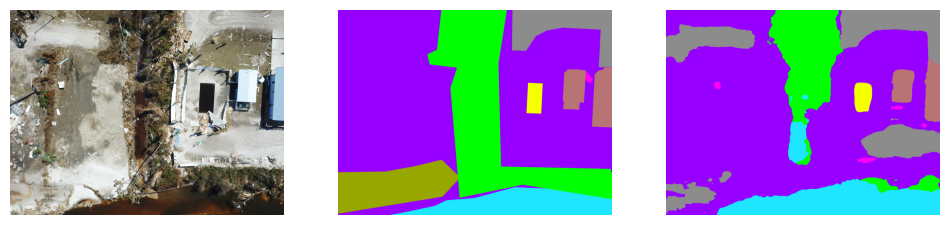

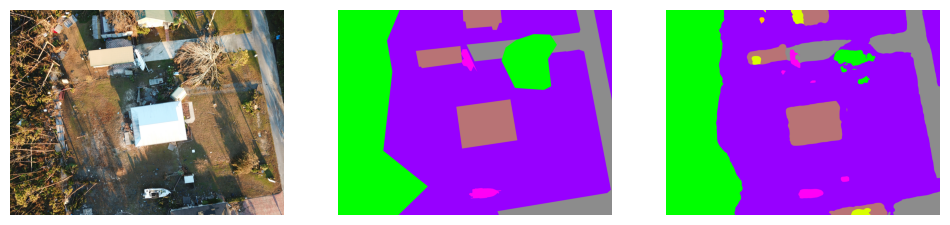

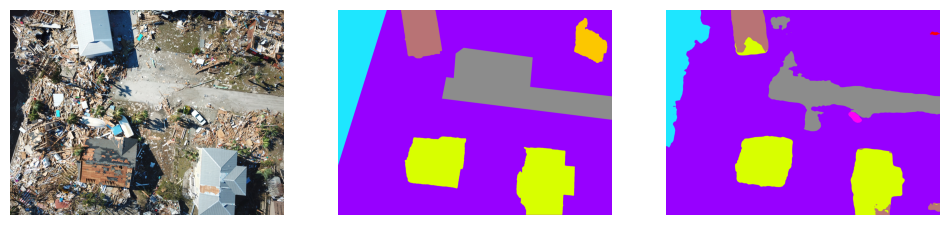

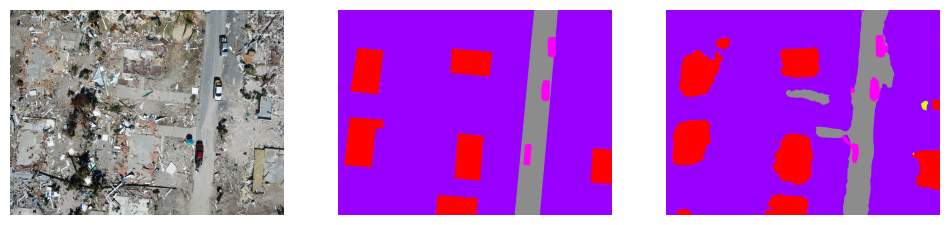

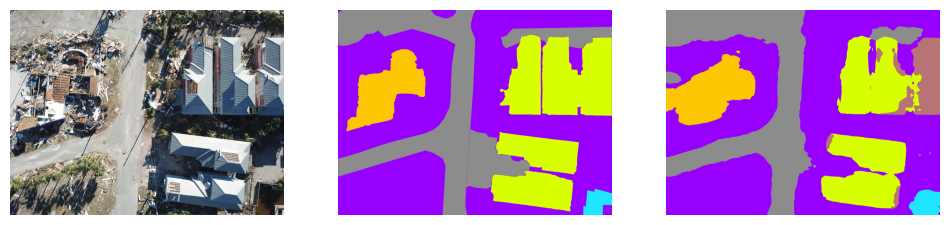

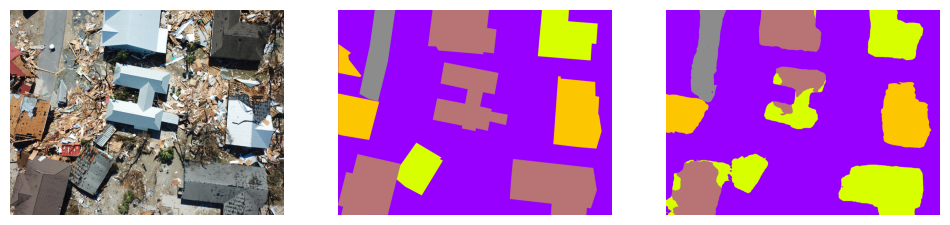

In [18]:
imglist=[15783, 13205,11236, 10844, 12272,11669]
origin_dir = '/kaggle/input/rescuenet/RescueNet/test/test-org-img/'
anno_dir = '/kaggle/input/rescuenet/RescueNet/test/test-label-img/'
trained_model = makeModel(f'/kaggle/input/segb1-7')
for i in imglist:
    origin_img = f'{origin_dir}{i}.jpg'
    anno_img = f'{anno_dir}{i}_lab.png'
    show_one_comparision_no_checkpoint(origin_img,anno_img )


# Trained mit-b0 41 epochs

map classes:  ['Background', 'Water', 'Road', 'Tree', 'Sand']
map classes:  [ 0  2  8  9 11]
prediction classes:  ['Debris', 'Water', 'Road', 'Tree', 'Sand']
map classes:  ['Background', 'Water', 'Road', 'Tree', 'Sand']
map classes:  [ 0  2  8  9 11]
prediction classes:  ['Debris', 'Water', 'Building_No_Damage', 'Building_Minor_Damage', 'Road', 'Tree', 'Sand']


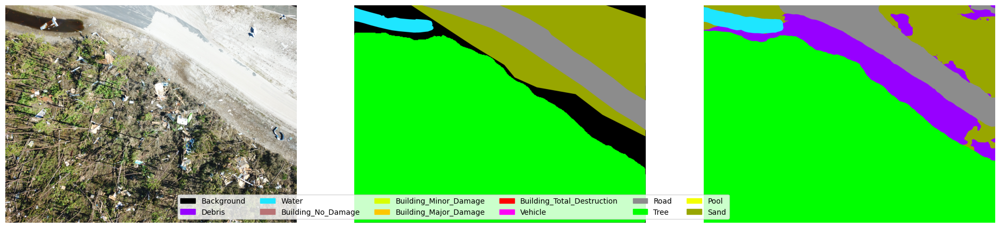

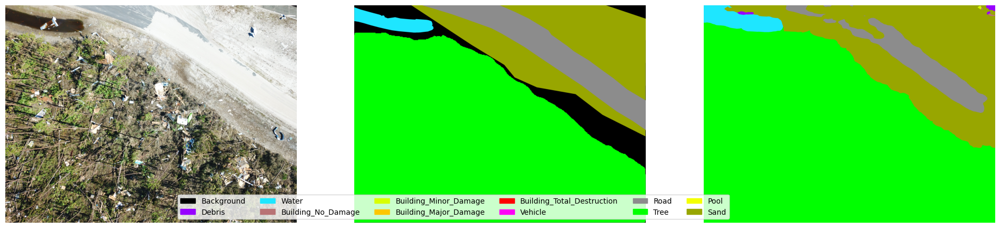

In [87]:
image = Image.open("/kaggle/input/rescuenet/RescueNet/test/test-org-img/11148.jpg")
mask = Image.open("/kaggle/input/rescuenet/RescueNet/test/test-label-img/11148_lab.png")
show_one_comparision(image, mask, "segtrained41")
show_one_comparision(image, mask, "segb1-7")

map classes:  ['Debris', 'Building_Total_Destruction', 'Road']
map classes:  [1 6 8]
prediction classes:  ['Debris', 'Building_Minor_Damage', 'Building_Major_Damage', 'Building_Total_Destruction', 'Road', 'Tree']
map classes:  ['Debris', 'Building_Total_Destruction', 'Road']
map classes:  [1 6 8]
prediction classes:  ['Debris', 'Building_Total_Destruction', 'Vehicle', 'Road']


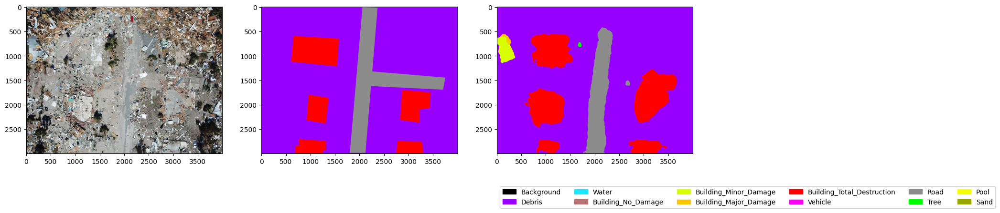

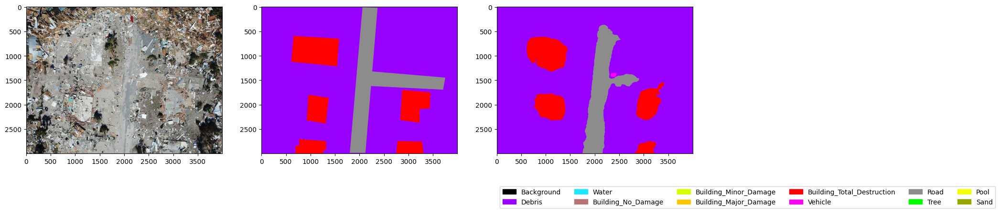

In [67]:
image = Image.open("/kaggle/input/rescuenet/RescueNet/test/test-org-img/10894.jpg")
mask = Image.open("/kaggle/input/rescuenet/RescueNet/test/test-label-img/10894_lab.png")
show_one_comparision(image, mask, "segtrained41")
show_one_comparision(image, mask, "segb1-7")

15783
map classes:  ['Debris', 'Water', 'Building_No_Damage', 'Vehicle', 'Road', 'Tree', 'Pool', 'Sand']
map classes:  [ 1  2  3  7  8  9 10 11]
prediction classes:  ['Debris', 'Water', 'Building_No_Damage', 'Building_Minor_Damage', 'Vehicle', 'Road', 'Tree', 'Pool', 'Sand']
map classes:  ['Debris', 'Water', 'Building_No_Damage', 'Vehicle', 'Road', 'Tree', 'Pool', 'Sand']
map classes:  [ 1  2  3  7  8  9 10 11]
prediction classes:  ['Debris', 'Water', 'Building_No_Damage', 'Vehicle', 'Road', 'Tree', 'Pool']
13205
map classes:  ['Debris', 'Building_No_Damage', 'Vehicle', 'Road', 'Tree']
map classes:  [1 3 7 8 9]
prediction classes:  ['Debris', 'Building_No_Damage', 'Building_Minor_Damage', 'Building_Major_Damage', 'Vehicle', 'Road', 'Tree']
map classes:  ['Debris', 'Building_No_Damage', 'Vehicle', 'Road', 'Tree']
map classes:  [1 3 7 8 9]
prediction classes:  ['Debris', 'Building_No_Damage', 'Building_Minor_Damage', 'Building_Major_Damage', 'Vehicle', 'Road', 'Tree']
11236
map classes: 

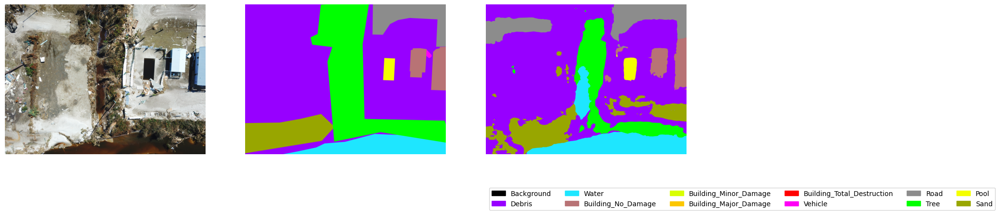

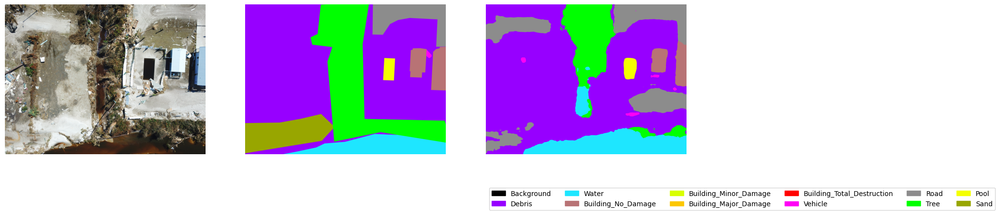

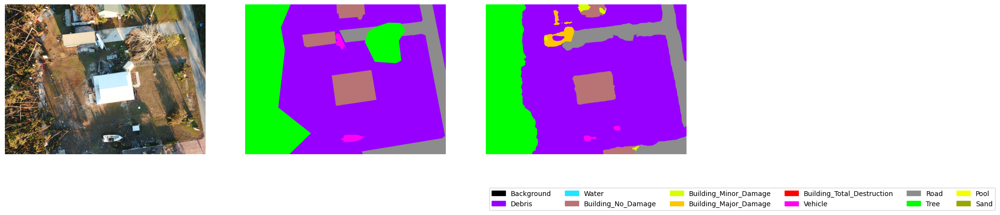

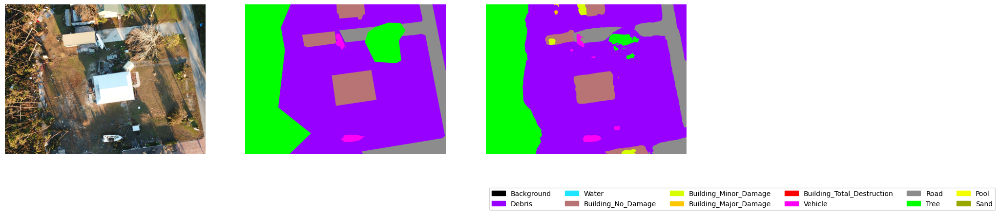

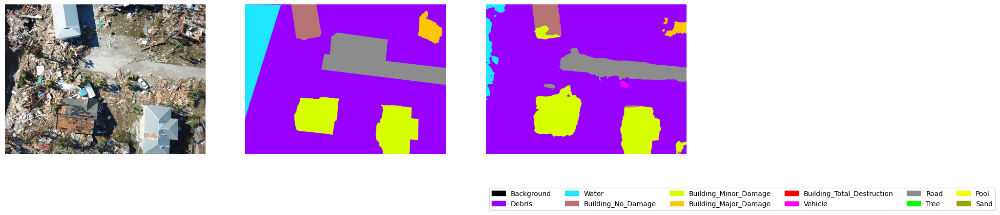

...

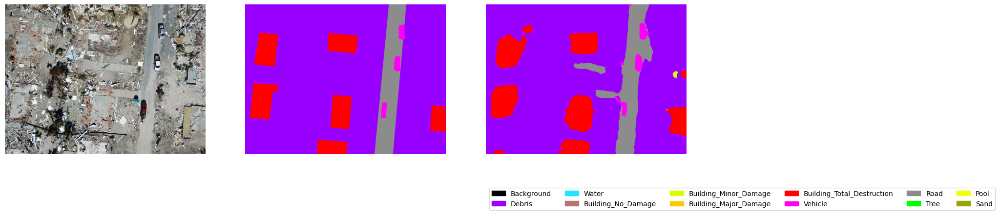

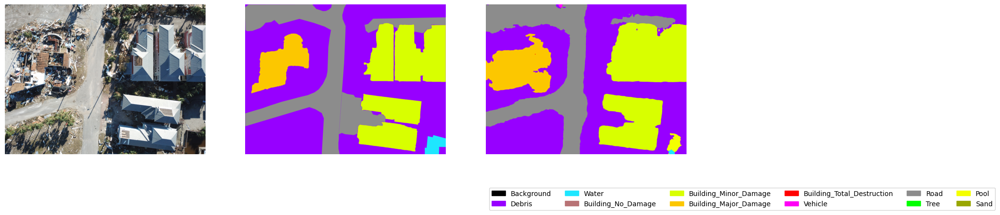

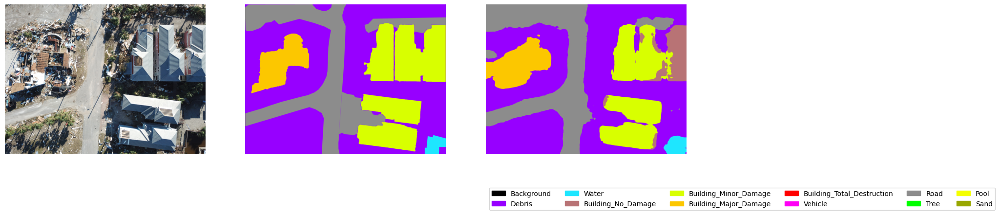

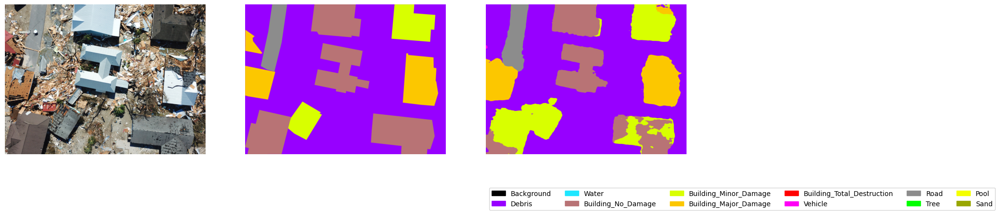

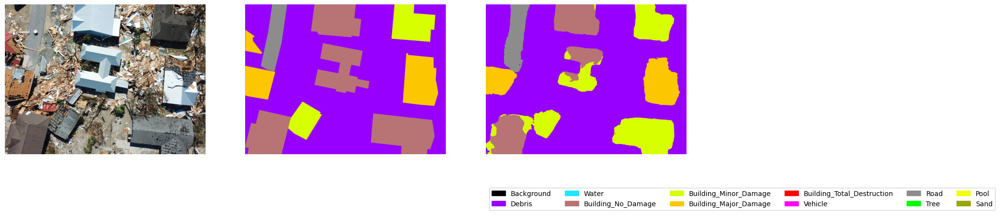

In [76]:
org_dir = "/kaggle/input/rescuenet/RescueNet/test/test-org-img/"
label_dir = "/kaggle/input/rescuenet/RescueNet/test/test-label-img/"
imglist=[15783, 13205,11236, 10844, 12272,11669]
for i in imglist:
    image = f'{org_dir}{i}.jpg'
    mask = f'{label_dir}{i}_lab.png'
    print(i)
    image = Image.open(image)
    mask = Image.open(mask)
    show_one_comparision(image, mask, "segtrained41")
    show_one_comparision(image, mask, "segb1-7")

# Test the Model

In [33]:
# Test one epoch

# Initialize IoU and F1 metrics
iou_metric = load_metric("mean_iou")
# iou_metric =load_metric()  # 12 classes including background
f1_metric = load_metric("f1")  # Using macro average for F1 score

def test_model_one_epoch(checkpoint, test_loader, device, metric, f1_metric):
    model = makeModel(checkpoint)
    model.eval()
    total_predictions = []
    total_labels = []
    for idx, batch in enumerate(tqdm(valid_dataloader)):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

            # Forward pass
        outputs = model(pixel_values=pixel_values, labels=labels)
#             loss = outputs.loss
        logits = outputs.logits
        with torch.no_grad():
            upsampled_logits = nn.functional.interpolate(logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)
            predicted = upsampled_logits.argmax(dim=1)
            total_predictions.append(predicted.cpu())
            total_labels.append(labels.cpu())
    
    total_predictions = torch.cat(total_predictions)
    total_labels = torch.cat(total_labels)
    metrics = metric._compute(
        predictions=total_predictions,
        references=total_labels,
        num_labels=len(id2label),
        ignore_index=255,
        reduce_labels=False,)
    f1_metric.add_batch(
        predictions=total_predictions.flatten().numpy().astype(int).tolist(),
        references=total_labels.flatten().numpy().astype(int).tolist()
    )
    total_f1 = f1_metric.compute(average="macro")
    
    print(metrics, total_f1)
    return [metrics, total_f1]


## Test mit-b0 41 epochs

In [34]:
test_metrics, f1= test_model_one_epoch("/kaggle/input/segtrained41", test_dataloader, 'cpu', iou_metric, f1_metric)

  0%|          | 0/57 [00:00<?, ?it/s]

/root/.cache/huggingface/modules/datasets_modules/metrics/mean_iou/d4add40cf977cdd73590b5873fa830f3f13adb678f6777a29fb07b7c81d14342/mean_iou.py:258: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/datasets_modules/metrics/mean_iou/d4add40cf977cdd73590b5873fa830f3f13adb678f6777a29fb07b7c81d14342/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


{'mean_iou': 0.5794175294716122, 'mean_accuracy': 0.699702915382474, 'overall_accuracy': 0.8261209518679841, 'per_category_iou': array([0.6400747 , 0.84364515, 0.55186564, 0.44310394, 0.38147591,
       0.44647584, 0.39627811, 0.73826494, 0.76839575, 0.37441629,
       0.78959656,        nan]), 'per_category_accuracy': array([0.79114181, 0.91903054, 0.62950327, 0.79054649, 0.48061844,
       0.63400864, 0.44247404, 0.84687077, 0.82646523, 0.42416096,
       0.9119119 ,        nan])} {'f1': 0.6498444830325885}


In [32]:
metrics = test_metrics
# print overall metrics
for key in list(metrics.keys())[:3]:
    print(key, metrics[key])

# pretty-print per category metrics as Pandas DataFrame
metric_table = dict()
for id, label in id2label.items():
    metric_table[label] = [
                           metrics["per_category_iou"][id-1],
                           metrics["per_category_accuracy"][id-1]
    ]

print("---------------------")
print("per-category metrics:")
pd.DataFrame.from_dict(metric_table, orient="index", columns=["IoU", "accuracy"])

mean_iou 0.5794175294716122
mean_accuracy 0.699702915382474
overall_accuracy 0.8261209518679841
---------------------
per-category metrics:


,IoU,accuracy
Background,NaN,NaN
Debris,0.640075,0.791142
Water,0.843645,0.919031
Building_No_Damage,0.551866,0.629503
Building_Minor_Damage,0.443104,0.790546
Building_Major_Damage,0.381476,0.480618
Building_Total_Destruction,0.446476,0.634009
Vehicle,0.396278,0.442474
Road,0.738265,0.846871
Tree,0.768396,0.826465


## mit-b1 7 epochs

In [37]:
test_metrics, f1= test_model_one_epoch("/kaggle/input/segb1-7", test_dataloader, 'cpu', iou_metric, f1_metric)

  0%|          | 0/57 [00:00<?, ?it/s]

/root/.cache/huggingface/modules/datasets_modules/metrics/mean_iou/d4add40cf977cdd73590b5873fa830f3f13adb678f6777a29fb07b7c81d14342/mean_iou.py:258: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/datasets_modules/metrics/mean_iou/d4add40cf977cdd73590b5873fa830f3f13adb678f6777a29fb07b7c81d14342/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


{'mean_iou': 0.5842154949015553, 'mean_accuracy': 0.6954557444394923, 'overall_accuracy': 0.8271516923680347, 'per_category_iou': array([0.62673485, 0.84168636, 0.64230103, 0.46079734, 0.33106942,
       0.42471236, 0.4611497 , 0.72586071, 0.79556214, 0.36232578,
       0.75417075,        nan]), 'per_category_accuracy': array([0.73487005, 0.92055707, 0.73498557, 0.67867519, 0.3980774 ,
       0.52363126, 0.59223784, 0.83478785, 0.91080435, 0.40671234,
       0.91467429,        nan])} {'f1': 0.6532560083371832}


In [38]:
metrics = test_metrics
# print overall metrics
for key in list(metrics.keys())[:3]:
    print(key, metrics[key])

# pretty-print per category metrics as Pandas DataFrame
metric_table = dict()
for id, label in id2label.items():
    metric_table[label] = [
                           metrics["per_category_iou"][id-1],
                           metrics["per_category_accuracy"][id-1]
    ]

print("---------------------")
print("per-category metrics:")
pd.DataFrame.from_dict(metric_table, orient="index", columns=["IoU", "accuracy"])

mean_iou 0.5842154949015553
mean_accuracy 0.6954557444394923
overall_accuracy 0.8271516923680347
---------------------
per-category metrics:


,IoU,accuracy
Background,NaN,NaN
Debris,0.626735,0.734870
Water,0.841686,0.920557
Building_No_Damage,0.642301,0.734986
Building_Minor_Damage,0.460797,0.678675
Building_Major_Damage,0.331069,0.398077
Building_Total_Destruction,0.424712,0.523631
Vehicle,0.461150,0.592238
Road,0.725861,0.834788
Tree,0.795562,0.910804


##  Test Efficiency  

In [77]:
import time
def calculate_fps_latency(checkpoint, input_size= (1, 3, 512, 512), num_samples=100):
    model = makeModel(checkpoint)
    model.eval()
    device = next(model.parameters()).device  # Get the device of the model (cuda or cpu)
    start_time = time.time()
    with torch.no_grad():
        for _ in range(num_samples):
            input_data = torch.rand(input_size).to(device)  # Move input data to the correct device
            output = model(input_data)
    end_time = time.time()
    
    total_time = end_time - start_time
    latency = (total_time / num_samples) * 1000  # in milliseconds
    fps = 1 / (total_time / num_samples)
    
    return fps, latency

## mit-b0

In [78]:

fps, latency = calculate_fps_latency('/kaggle/input/segtrained41')
print(f"FPS: {fps}")
print(f"Latency: {latency} ms")

FPS: 2.417087600719523
Latency: 413.7210416793823 ms


# mit-b1

In [79]:
fps, latency = calculate_fps_latency('/kaggle/input/segb1-7')
print(f"FPS: {fps}")
print(f"Latency: {latency} ms")

FPS: 1.5818676704520096
Latency: 632.1641302108765 ms


## mit-b2